# Numerical simulation of the wave equation in 1D using Finite Difference

## Import libraries

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as anim
from IPython.display import HTML
import sys

----

## Create domain model properties (i.e. speed of waves), and discretisation grid

In [2]:
nx = 800  # 800 gridpoints along the x-axis

# start with homogeneous model - same wave-speed everywhere.
c = np.full(nx,1500.0)  # Note: 1500m/s is typical acoustic velocity of water

# a faster section, halfway across model, to show reflection of waves when crossing sharp interface
c[400:] = 2500.0  # Note: 2500m/s is fairly typical acoustic velocity of sedimentary rock

In [3]:
length = 6000.0  # assign a length to the model in metres

dx = length/nx  # calculate the spatial increment between model parameters

print('Domain is %d grid-cells (%.1fm)' % (nx,length))
print('Grid-spacing (dx) is %.5fm' % (dx))

Domain is 800 grid-cells (6000.0m)
Grid-spacing (dx) is 7.50000m


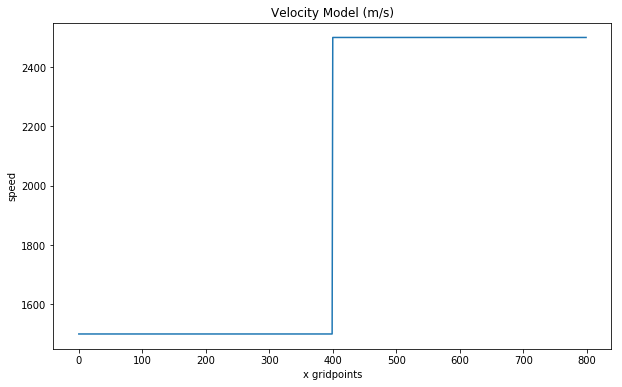

In [4]:
plt.figure(figsize=(10,6))
plt.plot(c) # plotting the velocity model
plt.xlabel('x gridpoints')
plt.ylabel('speed')
plt.title('Velocity Model (m/s)')
plt.show()

----
## Modelling constraints
#### CFL stability condition should be satisfied – the 'Courant number'.

The dimensionless Courant number, $C$, gives a measure of how far a signal will travel across a grid-cell (/between grid-points) within one time-step.
(Hence why I will very often refer to it as 'the crossing factor'.)

The crossing factor is $c$.$\delta t$/$\delta x$ for speed $c$, and we want the maximum value of this within the whole domain to satisfy some constraint that depends upon the finite-difference stencil(s) in use when modelling.

i.e. we want:$\quad \text{max}(c)$.$\delta t/\delta x <= C_{max}$, where $\ C_{max}$ depends on the discretisation.

We can turn this around to find the maximum time-step for our model and grid-spacing, given $C_{max}$ for our discretisation:

$$\delta t_{best} = \frac{C_{max}\ \delta x}{\text{max}(c)}$$

#### This simple stencil (2nd order), with 2nd order time-stepping, for the 1d wave equation, allows max crossing factor to be up to 1.0
(i.e. can only cross up to 100% of a cell in one time-step – but we'll use 80% below.)

In [5]:
C = 0.8  # set the dimensionless max Courant number that we want to use to work out time-step below

In [6]:
time = 5.0  # desired length of the simulation in seconds
dt = (C*dx)/c.max()  # define the best time-step by using the max Courant number
nt = int(time/dt+0.9999)  # find how many steps are needed to cover that time
time = nt*dt  # turn that back into exact time for this number of steps
print('Time-step = %.5fs  Number of steps = %d  (Total time being modelled: %.5fs)' % (dt,nt,dt*nt))

Time-step = 0.00240s  Number of steps = 2084  (Total time being modelled: 5.00160s)


### Create source function (Ricker wavelet with 6Hz peak frequency)

In [7]:
# want to locate the source at some point in the grid
sx = 150  # this is somewhat towards the left side (domain has 800 gridpoints)

The Ricker wavelet used here is a function of time that's defined from the second derivate of a Gaussian function (which is $G(t)=\text{e}^{-a^2 t^2}$).

–It's also known as the Mexican hat wavelet, due to its shape when plotted as a function of two variables.

It can be written so it is symmetric about time zero, with maximum at that time, ultimately decaying towards zero as $t$$\rightarrow$$±\infty$. However, we will shift it in time so that it starts near zero at our time zero.

After differentiating above Gaussian, $G(t)$, twice, flipping, then scaling (and before shifting in time), we get: $\quad R(t) = (1-2a^2 t^2)\ \text{e}^{-a^2 t^2}$

The peak frequency of the Ricker wavelet is at $f$=$a/\pi$.

The length of the wavelet, in time, before it decays close enough to zero for our purposes, is about $\frac{2.1}{f}$ (i.e. about $\frac{1.05}{f}$ seconds each side of the wavelet's central peak).

In [8]:
amp = 1.0  # amplitude of the source function 
freq = 6.0  # peak frequency of source function
ts = 2.1/freq  # desired length of source in time is related to peak frequency
ns = int(ts/dt+0.9999)  # figure out how many time-steps are needed to cover that time
print('Length of source is %d steps (%.5f secs, was %.5fs)' % (ns,ns*dt,ts))
ts = ns*dt  # and now turn that back into a time that's exactly the required number of steps

Length of source is 146 steps (0.35040 secs, was 0.35000s)


In [35]:
a2 = (freq*np.pi)**2  # a squared (see equation above)
t0 = ts/2 - dt/2  # midpoint time of wavelet
src = np.zeros(ns)
# create Ricker wavelet (see equation above), offset by time t0 (so midpoint of wavelet is at time t=t0)
for i in range(ns):
    src[i] = amp*( (1 - 2*a2*((i*dt-t0)**2)) * np.exp(-a2*((i*dt-t0)**2)) )
    #src[i] = amp*np.sin((0.5+i)*np.pi/ns)**2  # uncomment to make sine-squared 'bump' instead (not 6Hz peak tho')
print('Endpoint values are: %.6f %.6f' % (src[0],src[-1]))

Endpoint values are: -0.000437 -0.000437


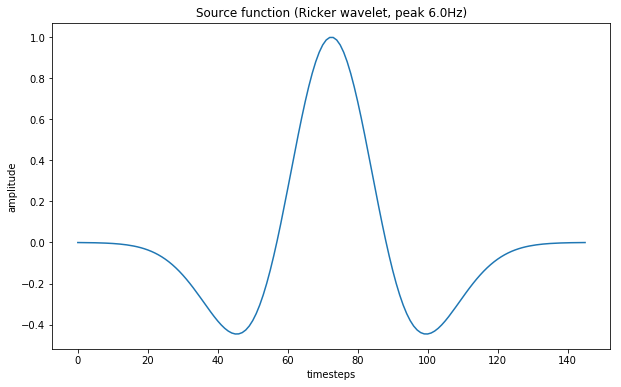

In [36]:
plt.figure(figsize=(10,6))
plt.plot(src) # plot source function
plt.xlabel('timesteps')
plt.ylabel('amplitude')
plt.title('Source function (Ricker wavelet, peak %.1fHz)' % (freq))
plt.show()

### Check that the maximum frequency in the source function can propagate reliably

For a simple second-order finite-difference, the minimum wavelength of a signal that we can propagate reliably is about 10 cells.

In [37]:
# minimum of 10 cells per wavelength for reasonably accurate propagation (i.e. minimal numerical dispersion):
min_cells_per_wl = 10.0

# calculate the max frequency that can be modelled without numerical dispersion:
max_freq = c.min()/(min_cells_per_wl*dx)

print('Maximum reliable propagation frequency is about %.1fHz' % max_freq)

Maximum reliable propagation frequency is about 20.0Hz


#### Want to avoid causing too much dispersion by keeping maximum significant frequency within this limit...

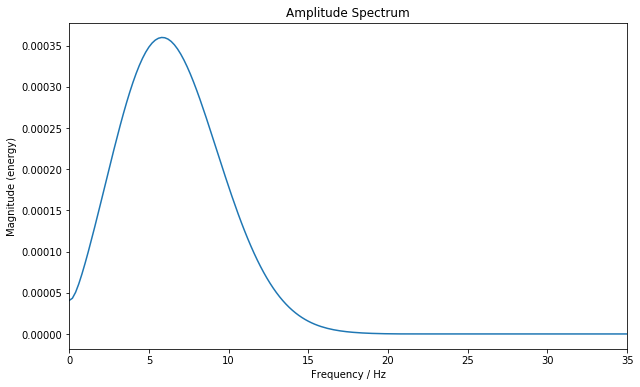

In [38]:
# plot amplitude spectrum of source function
plt.figure(figsize=(10,6))
plt.magnitude_spectrum(np.append(src,np.zeros(nt-ns)), Fs=1/dt)  # note padding to nt points
plt.title('Amplitude Spectrum')
plt.xlim(0,35)
plt.xlabel('Frequency / Hz')
plt.show()

----
## Create absorbing layers

In [39]:
# want layer at both sides of the model to be 60 cells thick
abswid = 60

Choose one of the following three absorbing models to try (i.e. just run one of the three cases)

In [40]:
# CONSTANT

a = np.zeros(nx)  # initialise array with zeros

a[:abswid]  = 1.0  # left layer
a[-abswid:] = 1.0  # right layer

absfact = 0.04

In [41]:
# LINEAR

a = np.zeros(nx)  # initialise array with zeros

# left and right absorbing layers
for i in range(1,abswid+1):  # sixty cells in layers
    a[abswid-i]   = 1.0*i/abswid  # linear increase towards left boundary
    a[i-abswid-1] = 1.0*i/abswid  # linear increase towards right boundary

absfact = 0.08  # this value works well when there is no predictive boundary

# When the predictive boundary is working, try reducing absfact to about half its value above.
# You could try tweaking it a bit more yourself if you want.

In [42]:
# QUADRATIC

a = np.zeros(nx)  # initialise array with zeros

absw2 = abswid*abswid  # useful shorthand

# left and right absorbing layers
for i in range(1,abswid+1):  # sixty cells in layers
    a[abswid-i]   = 1.0*i*i/absw2  # quadratic increase towards left boundary
    a[i-abswid-1] = 1.0*i*i/absw2  # quadratic increase towards right boundary

# try 80 cells instead for absorbing layer on right side
for i in range(1,81):
    a[i-80]   = 1.0*i*i/(80*80)  # quadratic increase towards right boundary

absfact = 0.1  # this value works well when when there is no predictive boundary

# When the predictive boundary is working, try reducing absfact to about half its value above.
# You could try tweaking it a bit more yourself if you want.

#### Show the absorption model (before scaling by model)

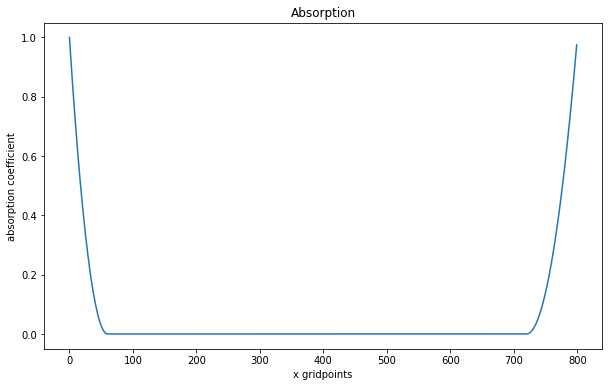

In [43]:
plt.figure(figsize=(10,6))

plt.title('Absorption')

plt.plot(a)
plt.xlabel('x gridpoints')
plt.ylabel('absorption coefficient')
plt.show()

Finish by scaling with velocity and other factors, for direct use in simulation later

In [44]:
absfact = 0.0  # comment this line when you want to switch on absorbing layers again!

a[:] = a[:]*c[:]*(dt/dx)*absfact

## Predictive boundary condition

This works by predicting what the value will be at the edge point(s) at the next step, given that we know what the current value is at that point, and at the point just inside, and we know that the wave should be propagating out of the domain at some known speed (since we know the model properties).

By assuming a simple linear connection between the edge point and the point just inside, and then 'shifting' that line across by the crossing factor (i.e. how far the wave should move during the step), we can 'predict' what the new value should be at the edge point.

For the left edge, at $x$=0, this looks like:

$$u(0,t+\delta t)\ \approx\ (1-C_0)\ u(0,t)\ +\ C_0\ u(\delta x,t)\quad
\text{where: }\ C_0 = \frac{c(0)\ \delta t}{\delta x}\ \text{ is 'crossing factor' near $x$=0}$$

And for other edge, at $x$=$L$:

$$u(L,t+\delta t)\ \approx\ (1-C_L)\ u(L,t)\ +\ C_L\ u(L-\delta x,t)\quad
\text{where: }\ C_L = \frac{c(L)\ \delta t}{\delta x} \text{ (i.e. near $x$=$L$)}$$


>**Task 1:**
>
>**Use the above equations to give values to two variables, `C0` and `CL`, which are the crossing factors at each edge of the domain.**
>
>**Go to the code cell containing the time-stepping, and fill in code where indicated that uses these two variables to set values for `u_nxt` at the edges of the domain.**  
>
>**When you have it working:**  
>– how do the remaining reflections from the boundaries compare with before having any type of absorbing boundary at all?  
>– how do they compare with the remaining reflections that you saw from the absorbing layer?  
>
>**Switch back on the absorbing layers (comment out the `absfact = 0.0` line in the code cell just above).**  
>– when you run it all again, how does it compare now?
>
>**Now that the predictive boundary is absorbing some of the wavefield at the boundary, we can reduce the strength of the absorbing layers by reducing `absfact`...**  
>– Try halving its value –does that reduce the reflections?  
>– Perhaps try to tweak it even more yourself.  
>– Can you think of more things we could try which might help to 'balance' the two types of absorbing boundaries?

In [45]:
# FILL IN CODE HERE TO SET C0 and CL to the crossing factors at the two domain sides





## Receiver points within domain
–To detect what crosses a few particular points of the domain over time

In [46]:
rz = np.array([70,100,640])  # put receivers at various grid-points in domain
r = np.zeros((rz.shape[0],nt))  # an array to store 3 sets of receiver data every step (and to plot later)

----
# Simulation

In [47]:
# Initialise arrays for wavefields
u = np.zeros(nx) # current wavefield
u_prv = np.zeros(nx) # previous wavefield, at t-1
u_nxt = np.zeros(nx) # next wavefield, at t+1

In [48]:
# prepare an array to store wavefield snapshots for plotting
sampling_rate = 5 # set sampling rate used to store wavefield (every 10 timesteps)
wavefield = np.zeros((int(nt/sampling_rate), nx)) # array to store wavefields every 10 timesteps
print('Storing %d wavefields (every %dth out of %d)' % (wavefield.shape[0],sampling_rate,nt))

Storing 416 wavefields (every 5th out of 2084)


In [49]:
# a useful variable – shorthand for something that appears regularly in expressions below
dtdx2 = (dt*dt)/(dx*dx)

In [50]:
u[sx] = src[0]  # put first source entry into current wavefield

# begin time-stepping loop...

for i in range(nt):

    if i%20==0:
        sys.stdout.write('Done step %d of %d\r' % (i+1,nt))

    # find new wavefield, u_new, throughout domain (apart from edges)
    for ix in range(1,nx-1):
        u_nxt[ix] = ( (c[ix]**2) * dtdx2 * (u[ix-1]-2*u[ix]+u[ix+1])  \
                    + (2-a[ix]**2)*u[ix] - u_prv[ix]*(1-a[ix]) ) / (1+a[ix])


    # FILL IN CODE HERE TO USE THE PREDICTIVE BOUNDARY CONDITIONS TO SET u_nxt AT EACH EDGE...
    
    
    
    
    # put in source function as if it's a 'forced' boundary condition (rather than injecting by adding),
    # up until the source function runs out of steps
    if i+1<ns:
        u_nxt[sx] = src[i+1]

    r[:,i] = u_nxt[rz[:]]  # record values at receiver points

    # shift wavefields for next time-step
    u_prv[:] = u[:]
    u[:] = u_nxt[:]
    
    # store the current wavefield u on every Nth step (where N=sampling_rate, as defined earlier)
    if (i+1)%sampling_rate == 0:
        wavefield[int((i+1)/sampling_rate-1),:] = u[:]

print('Finished all %d steps' % (nt))

Finished all 2084 steps


>**Task 2: optimisation (speed)**
>
>**The above code runs within a reasonable time for our simple 1d case. However, it's going to be too slow when we come to code this in 2d later on...**
>
>**In python you can work on a whole array in a single line, rather than working element-by-element in a loop.**
>
>**For example, take the following code:**
>
>$\quad$ `for i in range(n):`  
>$\quad\quad$ `b[i] = a[i+5]`  
>
>**This can be replaced with a single line that does the whole array:**
>
>$\quad$ `b[:n] = a[5:n+5]`
>
>**Use the above method to replace the `for ix in range(1,nx-1):` loop in the time-stepping code cell above.**  
>– Do you see much improvement in the time it takes?

>**Task 3: more optimisations (memory use, reduction in work)**
>
>**The code we've developed here makes use of three arrays, `u_nxt`, `u` & `u_prv`, to store the wavefields for three points in time at each step (i.e. at $t$+$\delta t$, $t$ & $t$$-$$\delta t$).**
>
>**– Can you see a way to reduce this to using only two arrays?**
>
>**– Can you see a way to avoid 'shifting' the wavefields between arrays at the end of each time-step?**

## Plot wavefield at different times

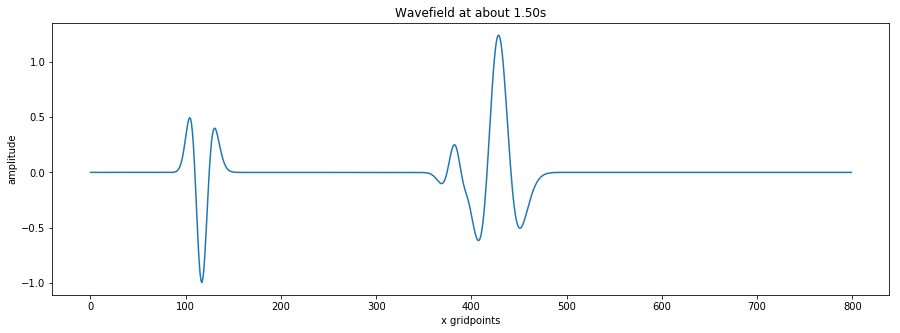

In [51]:
plot_time = 1.5  # 1.5 seconds
plt.figure(figsize=(15,5))
plt.plot(wavefield[int(plot_time/(dt*sampling_rate)),:])
plt.title('Wavefield at about %.2fs' % (plot_time))
plt.xlabel('x gridpoints')
plt.ylabel('amplitude')
plt.show()

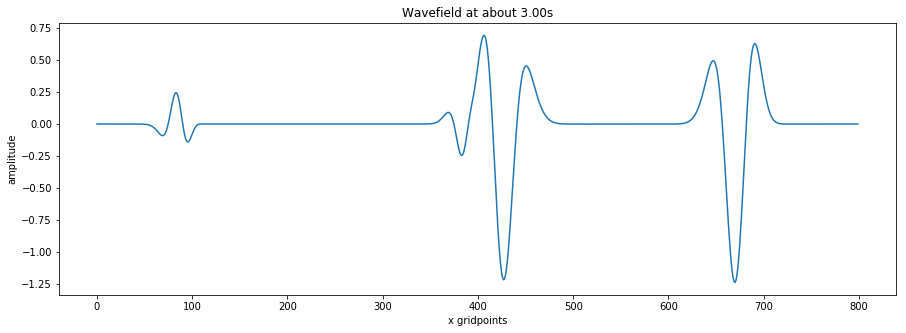

In [52]:
plot_time = 3.0  # 3 seconds
plt.figure(figsize=(15,5))
plt.plot(wavefield[int(plot_time/(dt*sampling_rate)),:])
plt.title('Wavefield at about %.2fs' % (plot_time))
plt.xlabel('x gridpoints')
plt.ylabel('amplitude')
plt.show()

## Plot data at receivers

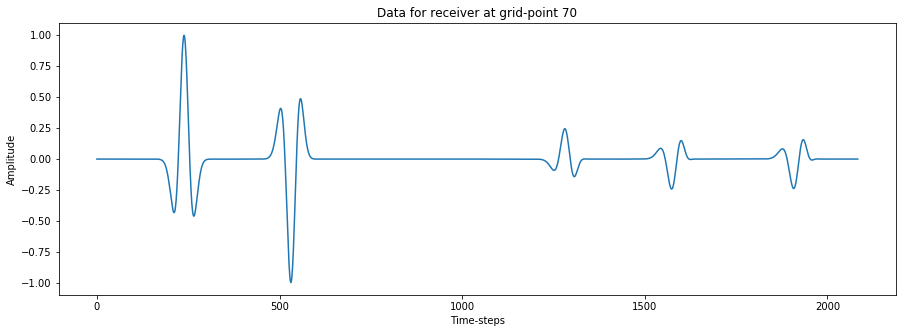

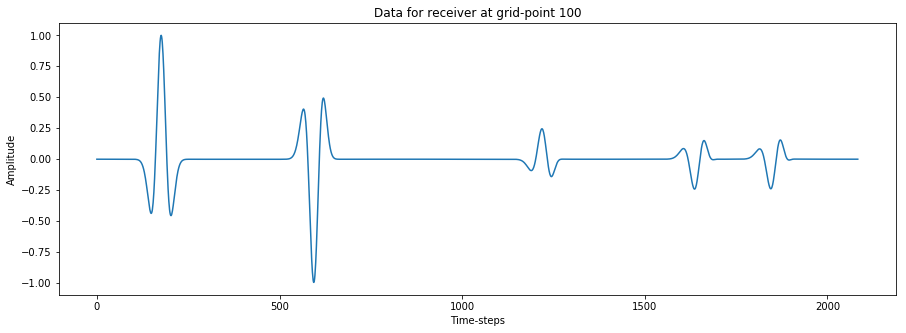

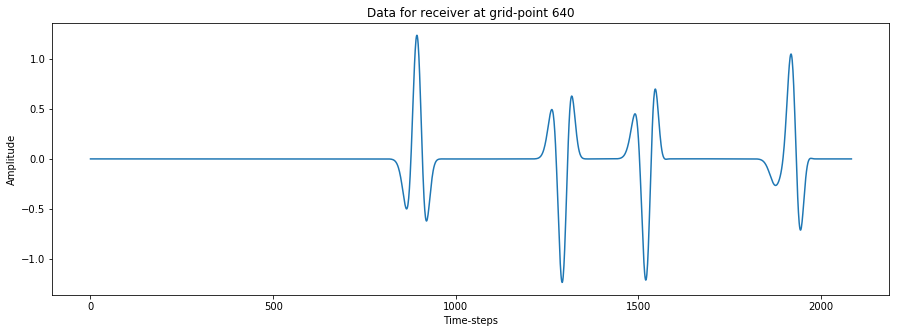

In [53]:
for i in range(r.shape[0]):
    plt.figure(figsize=(15,5))
    plt.plot(r[i])
    plt.title('Data for receiver at grid-point %d' % (rz[i]))
    plt.ylabel('Amplitude')
    plt.xlabel('Time-steps')
    plt.show()

## Show space-time plot for whole wavefield

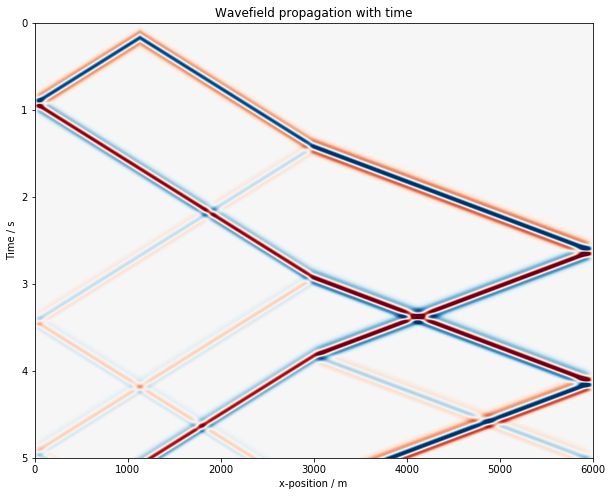

In [54]:
fig = plt.figure(figsize=(10,8))
plt.imshow(wavefield, cmap='RdBu', interpolation='bilinear', aspect='auto',
           vmin=-1, vmax=1,       # set the bounds for the colour data
           extent=(0,length,time,0))  # set the bounds for the axes
plt.title('Wavefield propagation with time')
plt.xlabel('x-position / m')
plt.ylabel('Time / s')
plt.show()


## Make a movie! 

In [55]:
#plt.ioff()

fig, ax = plt.subplots(figsize=(15,6))

x = np.arange(0, wavefield.shape[1], 1)
line, = ax.plot(x,wavefield[0])

plt.title('Wavefield')
plt.xlabel('x gridpoint')
plt.ylabel('amplitude')
plt.ylim(-1.3,1.3)

#def init():  # only required for blitting to give a clean slate.
#    line.set_ydata(wavefield[0])
#    return line,

def frame(i):
    line.set_ydata(wavefield[i])
    return line,

print('Finished plots for frames, building animation...')

#ani = anim.FuncAnimation(fig, frame, init_func=init, interval=50, blit=True, save_count=wavefield.shape[0])
ani = anim.FuncAnimation(fig, frame, interval=50, save_count=wavefield.shape[0])

plt.close(fig)  # prevent final image from showing up inline just below

print('Preparing HTML (takes a little while...)')

HTML(ani.to_jshtml())

Finished plots for frames, building animation...
Preparing HTML (takes a little while...)
